In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import os
os.listdir('Datasets/')

['uber-raw-data-janjune-15.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'other-Federal_02216.csv',
 'uber-raw-data-sep14.csv',
 'other-Lyft_B02510.csv',
 'uber-raw-data-apr14.csv',
 'other-Diplo_B01196.csv',
 'uber-raw-data-aug14.csv',
 'other-American_B01362.csv',
 'other-Firstclass_B01536.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Prestige_B01338.csv',
 'uber-raw-data-jul14.csv',
 'other-Skyline_B00111.csv',
 'other-Highclass_B01717.csv',
 'other-Dial7_B00887.csv',
 'other-Carmel_B00256.csv',
 'uber-raw-data-may14.csv']

In [3]:
jj15 = pd.read_csv('Datasets/uber-raw-data-janjune-15_sample.csv')

In [4]:
jj15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 4 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   Dispatching_base_num  100000 non-null  object
 1   Pickup_date           100000 non-null  object
 2   Affiliated_base_num   98882 non-null   object
 3   locationID            100000 non-null  int64 
dtypes: int64(1), object(3)
memory usage: 3.1+ MB


In [5]:
jj15.head(2)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231


In [6]:
jj15 ['Pickup_date'] = pd.to_datetime(jj15['Pickup_date'], format='%Y-%m-%d %H:%M:%S')

In [7]:
jj15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 4 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Dispatching_base_num  100000 non-null  object        
 1   Pickup_date           100000 non-null  datetime64[ns]
 2   Affiliated_base_num   98882 non-null   object        
 3   locationID            100000 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 3.1+ MB


### Analyzing which month have the most uber pickups

In [8]:
jj15['month'] = jj15['Pickup_date'].dt.month

<AxesSubplot:xlabel='month'>

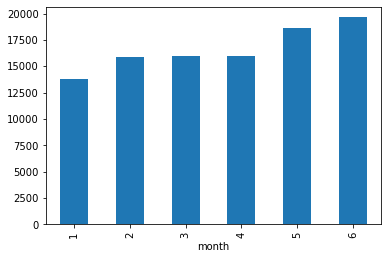

In [9]:
jj15.groupby('month')['Dispatching_base_num'].count().plot(kind='bar')

In [10]:
jj15['day'] = jj15['Pickup_date'].dt.day_name()

In [11]:
x = jj15.groupby(['month', 'day'])['Dispatching_base_num'].count().reset_index()

In [12]:
x.head(2)

,month,day,Dispatching_base_num
0,1,Friday,2508
1,1,Monday,1353


<AxesSubplot:xlabel='month', ylabel='Dispatching_base_num'>

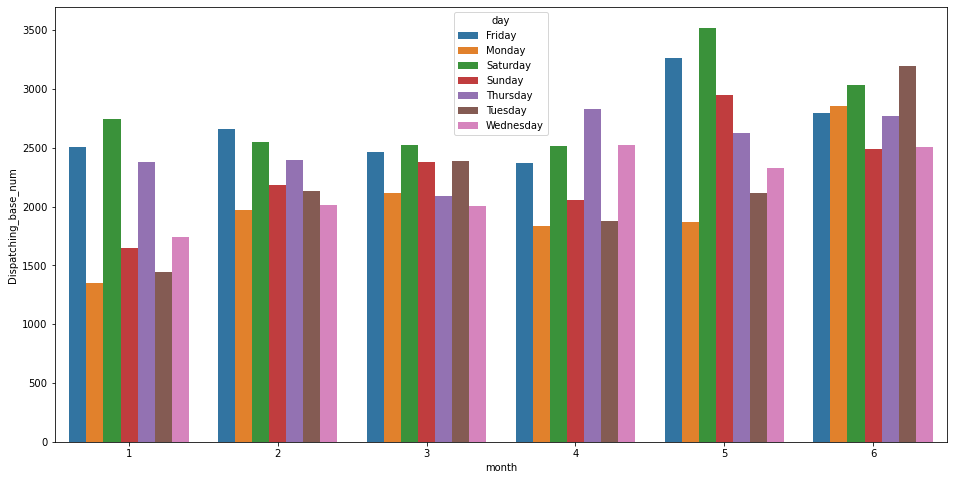

In [13]:
plt.figure(figsize=(16,8))
sns.barplot(data=x, x='month', y='Dispatching_base_num', hue='day')

Using pd.crosstab() to get a similar result like above graph

<AxesSubplot:xlabel='month'>

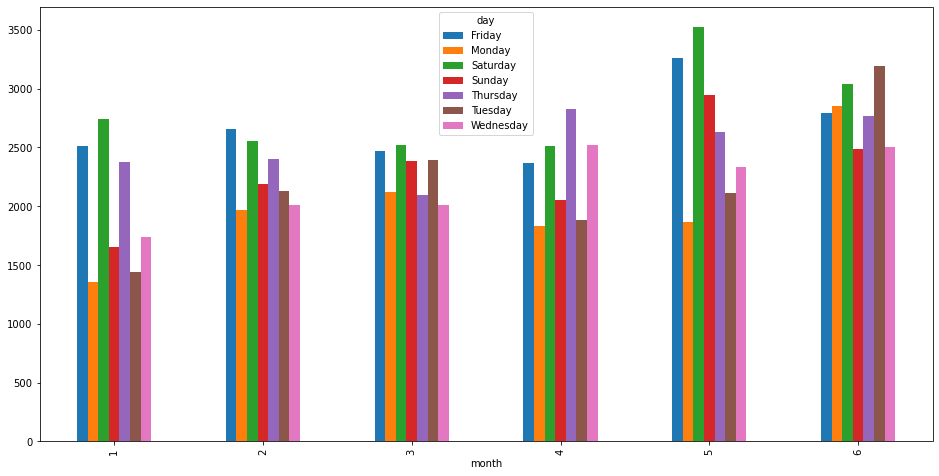

In [14]:
pd.crosstab(index=jj15['month'], columns=jj15['day']).plot(kind='bar', figsize=(16,8))

### Analyzing the rush hours on all days

In [15]:
jj15['hour'] = jj15['Pickup_date'].dt.hour

In [16]:
x1 = jj15.groupby(['hour', 'day'])['Dispatching_base_num'].count().reset_index()

In [17]:
x1.head(2)

,hour,day,Dispatching_base_num
0,0,Friday,581
1,0,Monday,339


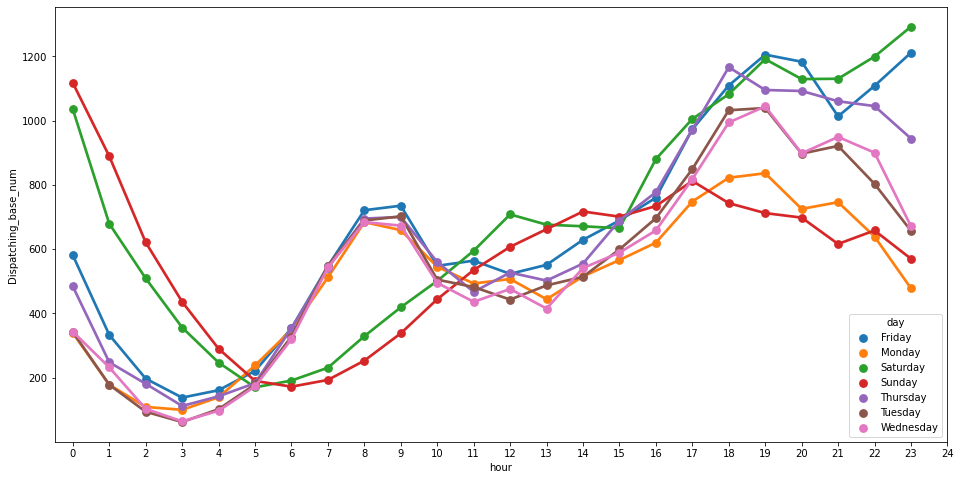

In [18]:
plt.figure(figsize=(16,8))
sns.pointplot(data=x1, x='hour', y='Dispatching_base_num', hue='day')
plt.xticks(ticks=range(0,25,1), labels=range(0,25,1));
#pd.crosstab(index=jj15['hour'], columns=jj15['day']).plot(figsize=(16,8))
#jj15.groupby(['day', 'hour'], as_index=False).agg(size=('Dispatching_base_num', 'count'))

- On weekdays from 5 am people start to use uber until 9 am. Supposedly to go to work. But on saturday and sunday not
- From 4pm to 6 pm is rush hour too. People are going back from work
- Saturday and friday night (at 10 and 11 pm) many people / new yorkers using grab. Maybe going to party

### Analyzing most active uber base number

In [19]:
jj15.head(2)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,day,hour
0,B02617,2015-05-02 21:43:00,B02764,237,5,Saturday,21
1,B02682,2015-01-20 19:52:59,B02682,231,1,Tuesday,19


In [20]:
foil = pd.read_csv('Datasets/Uber-Jan-Feb-FOIL.csv')

In [21]:
foil.head(2)

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765


In [22]:
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [23]:
px.box(data_frame=foil, x='dispatching_base_number', y='active_vehicles')

Violin plot is box + dist plot

In [24]:
px.violin(data_frame=foil, x='dispatching_base_number', y='active_vehicles')

In [25]:
t = [i.startswith('uber') for i in os.listdir('Datasets/')]
print(t)

[True, True, True, False, True, False, True, False, True, False, False, False, False, False, True, False, False, False, False, True]


In [26]:
idx = [i for i,x in enumerate(t) if x]
idx


[0, 1, 2, 4, 6, 8, 14, 19]

In [27]:
lst = os.listdir('Datasets/')

In [28]:
lst1 = [lst[i] for i in idx]
lst1.remove('uber-raw-data-janjune-15_sample.csv')
lst1.remove('uber-raw-data-janjune-15.csv')
lst1

['uber-raw-data-jun14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-may14.csv']

In [29]:
fin = pd.DataFrame()
path = 'Datasets/'

for i in lst1:
    current = pd.read_csv(path+i)
    fin = pd.concat([current, fin])
fin.shape

(4534327, 4)

In [30]:
fin.tail()

,Date/Time,Lat,Lon,Base
663839,6/30/2014 22:40:00,40.7332,-73.9872,B02764
663840,6/30/2014 23:12:00,40.7905,-73.9796,B02764
663841,6/30/2014 23:13:00,40.7640,-73.9887,B02764
663842,6/30/2014 23:15:00,40.7262,-73.9944,B02764
663843,6/30/2014 23:35:00,40.7404,-73.9848,B02764


In [31]:
fin = fin.reset_index(drop=True)

In [32]:
fin.shape

(4534327, 4)

In [33]:
fin.shape[0] - 82581

4451746

In [34]:
fin.duplicated().sum()

82581

In [35]:
fin.drop_duplicates(inplace=True)

In [36]:
fin.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

In [37]:
fin['Base'].unique()

array(['B02512', 'B02598', 'B02617', 'B02682', 'B02764'], dtype=object)

<AxesSubplot:xlabel='Base', ylabel='count'>

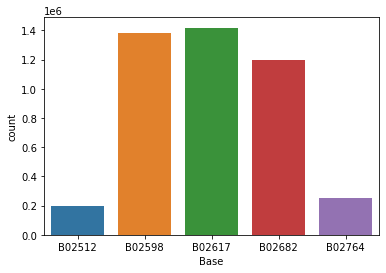

In [38]:
sns.countplot(data=fin, x='Base')

<AxesSubplot:xlabel='Lon', ylabel='Lat'>

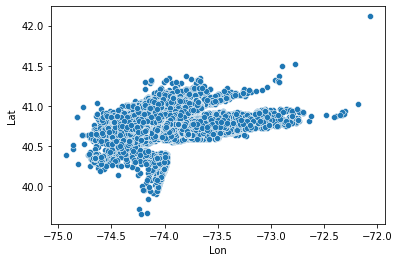

In [41]:
sns.scatterplot(data=fin, x='Lon', y='Lat')

### At what location at New York City we are getting rush?

In [48]:
loc1 = fin.groupby(['Lat', 'Lon'], as_index=False).agg(Size=('Base', 'count'))

In [54]:
loc1.head()

,Lat,Lon,Size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1


In [52]:
import folium

In [53]:
basemap = folium.Map()

In [56]:
from folium.plugins import HeatMap

In [57]:
HeatMap(loc1).add_to(basemap)

In [58]:
basemap

### Performing rush on hour and weekday

In [73]:
fin.head(2)

,Date/Time,Lat,Lon,Base
0,5/1/2014 0:02:00,40.7521,-73.9914,B02512
1,5/1/2014 0:06:00,40.6965,-73.9715,B02512


In [77]:
fin['hour'] = pd.to_datetime(fin['Date/Time'], format='%m/%d/%Y %H:%M:%S').dt.hour
fin['day'] = pd.to_datetime(fin['Date/Time'], format='%m/%d/%Y %H:%M:%S').dt.day_name()

In [80]:
x2 = pd.crosstab(index=fin['hour'], columns=fin['day'])

In [89]:
fin.groupby(['day', 'hour']).size().unstack().T.head()

day,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
hour,,,,,,,
0,13447,6327,27096,32275,9116,6116,7499
1,8002,3679,18783,22610,5169,3437,4233
2,5232,2885,12464,15126,3629,2502,3060
3,6788,6106,9356,10393,5532,4394,4762
4,8641,9460,6746,6261,8355,7404,7379


In [83]:
x2.head()

day,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
hour,,,,,,,
0,13447,6327,27096,32275,9116,6116,7499
1,8002,3679,18783,22610,5169,3437,4233
2,5232,2885,12464,15126,3629,2502,3060
3,6788,6106,9356,10393,5532,4394,4762
4,8641,9460,6746,6261,8355,7404,7379


<AxesSubplot:xlabel='day', ylabel='hour'>

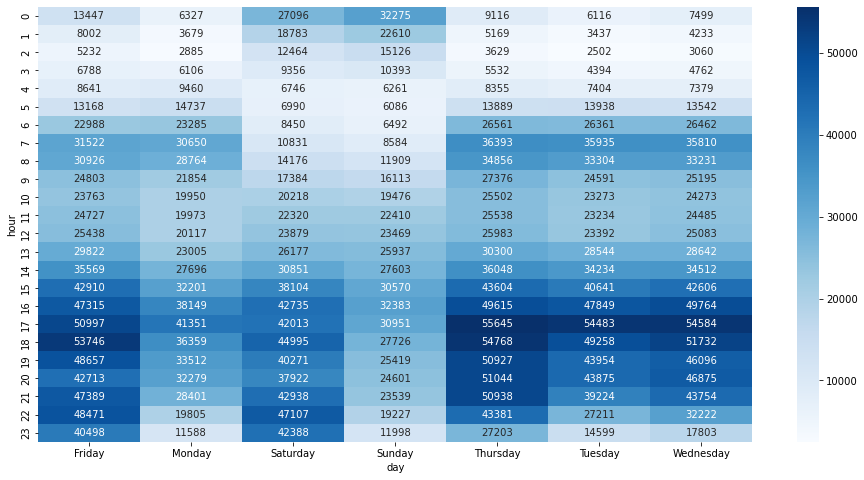

In [81]:
plt.figure(figsize=(16,8))
sns.heatmap(data=x2, annot=True, fmt='.0f', cmap='Blues')